In [1]:
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

class CelebAImageOnlyDataset(Dataset):
    def __init__(self, image_folder, image_size=128):
        self.image_folder = image_folder
        self.image_filenames = sorted([
            fname for fname in os.listdir(image_folder) if fname.endswith(".jpg")
        ])
        
        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)  # normalize to [-1, 1]
        ])

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_folder, self.image_filenames[idx])
        image = Image.open(img_path).convert("RGB")
        return self.transform(image)

# Set path to image folder
image_folder = "/kaggle/input/face-vae/img_align_celeba/img_align_celeba"

# Create dataset and dataloader
dataset = CelebAImageOnlyDataset(image_folder, image_size=128)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=2)


In [2]:
class CelebAColorizationDataset(Dataset):
    def __init__(self, image_folder, image_size=128):
        self.image_folder = image_folder
        self.image_filenames = sorted([
            fname for fname in os.listdir(image_folder) if fname.endswith(".jpg")
        ])
        
        self.transform_input = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.Grayscale(num_output_channels=1),  # Input: Grayscale
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
        ])

        self.transform_target = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)  # Normalize to [-1, 1]
        ])

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_folder, self.image_filenames[idx])
        image = Image.open(img_path).convert("RGB")
        gray = self.transform_input(image)
        color = self.transform_target(image)
        return gray, color


In [29]:
image_folder = "/kaggle/input/face-vae/img_align_celeba/img_align_celeba"

from torch.utils.data import random_split, DataLoader

# Dataset
dataset = CelebAColorizationDataset(image_folder, image_size=128)

# 50/50 split
total_len = len(dataset)
train_len = total_len // 2
test_len = total_len - train_len

train_dataset, test_dataset = random_split(dataset, [train_len, test_len])

# DataLoaders
dataloader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
testloader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)



In [30]:
import torch.nn as nn

class CBAM(nn.Module):
    def __init__(self, channels, reduction=16, kernel_size=7):
        super(CBAM, self).__init__()
        # Channel attention
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.channel_mlp = nn.Sequential(
            nn.Conv2d(channels, channels // reduction, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(channels // reduction, channels, 1, bias=False)
        )

        # Spatial attention
        self.spatial = nn.Sequential(
            nn.Conv2d(2, 1, kernel_size, padding=kernel_size // 2, bias=False),
            nn.Sigmoid()
        )

        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Channel attention
        avg_out = self.channel_mlp(self.avg_pool(x))
        max_out = self.channel_mlp(self.max_pool(x))
        ca = self.sigmoid(avg_out + max_out)
        x = x * ca

        # Spatial attention
        avg = torch.mean(x, dim=1, keepdim=True)
        max_ = torch.max(x, dim=1, keepdim=True)[0]
        sa = self.spatial(torch.cat([avg, max_], dim=1))
        x = x * sa

        return x


In [31]:
import torch
import torch.nn as nn

class UNetGenerator(nn.Module):
    def __init__(self):
        super(UNetGenerator, self).__init__()

        def down_block(in_channels, out_channels, normalize=True):
            layers = [nn.Conv2d(in_channels, out_channels, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.BatchNorm2d(out_channels))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            # Add CBAM if you want attention here, for example:
            layers.append(CBAM(out_channels))
            return nn.Sequential(*layers)

        def up_block(in_channels, out_channels, dropout=0.0):
            layers = [
                nn.ConvTranspose2d(in_channels, out_channels, 4, stride=2, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ]
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(CBAM(out_channels))
            return nn.Sequential(*layers)

        # Encoder blocks
        self.down1 = down_block(1, 64, normalize=False)    # 1 -> 64, no norm on first layer
        self.down2 = down_block(64, 128)                   # 64 -> 128
        self.down3 = down_block(128, 256)                  # 128 -> 256
        self.down4 = down_block(256, 512)                  # 256 -> 512
        self.down5 = down_block(512, 512)                  # 512 -> 512 (bottleneck)

        # Decoder blocks
        # Note input channels: previous decoder output + skip connection channels
        self.up1 = up_block(512, 512, dropout=0.5)          # input: 512 (from bottleneck)
        self.up2 = up_block(512 + 512, 256, dropout=0.5)    # input: up1 output + down4 output (512+512=1024)
        self.up3 = up_block(256 + 256, 128)                  # input: up2 output + down3 output (256+256=512)
        self.up4 = up_block(128 + 128, 64)                   # input: up3 output + down2 output (128+128=256)
        self.up5 = nn.Sequential(                            # final layer
            nn.ConvTranspose2d(64 + 64, 3, 4, stride=2, padding=1),  # up4 output + down1 output (64+64=128)
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder forward
        e1 = self.down1(x)  # [B,64,H/2,W/2]
        e2 = self.down2(e1) # [B,128,H/4,W/4]
        e3 = self.down3(e2) # [B,256,H/8,W/8]
        e4 = self.down4(e3) # [B,512,H/16,W/16]
        e5 = self.down5(e4) # [B,512,H/32,W/32]

        # Decoder forward with skip connections
        d1 = self.up1(e5)                    # [B,512,H/16,W/16]
        d1 = torch.cat([d1, e4], dim=1)     # concat channels: 512 + 512 = 1024

        d2 = self.up2(d1)                   # [B,256,H/8,W/8]
        d2 = torch.cat([d2, e3], dim=1)     # concat: 256 + 256 = 512

        d3 = self.up3(d2)                   # [B,128,H/4,W/4]
        d3 = torch.cat([d3, e2], dim=1)     # concat: 128 + 128 = 256

        d4 = self.up4(d3)                   # [B,64,H/2,W/2]
        d4 = torch.cat([d4, e1], dim=1)     # concat: 64 + 64 = 128

        out = self.up5(d4)                  # [B,3,H,W]

        return out


In [32]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        
        self.fc = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // reduction, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels // reduction, in_channels, 1, bias=False)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        out = avg_out + max_out
        return self.sigmoid(out)


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        padding = (kernel_size - 1) // 2
        self.conv = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out,_ = torch.max(x, dim=1, keepdim=True)
        concat = torch.cat([avg_out, max_out], dim=1)
        out = self.conv(concat)
        return self.sigmoid(out)


class CBAM(nn.Module):
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super().__init__()
        self.channel_att = ChannelAttention(in_channels, reduction)
        self.spatial_att = SpatialAttention(kernel_size)

    def forward(self, x):
        x_out = x * self.channel_att(x)
        x_out = x_out * self.spatial_att(x_out)
        return x_out


In [44]:
import torch.nn.utils.spectral_norm as spectral_norm

class PatchDiscriminator(nn.Module):
    def __init__(self):
        super(PatchDiscriminator, self).__init__()

        def disc_block(in_channels, out_channels, normalize=True):
            layers = [spectral_norm(nn.Conv2d(in_channels, out_channels, 4, stride=2, padding=1))]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_channels))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return nn.Sequential(*layers)

        self.block1 = disc_block(4, 64, normalize=False)
        self.block2 = disc_block(64, 128)
        self.block3 = disc_block(128, 256)
        self.cbam = CBAM(256)  # CBAM attention here
        self.block4 = disc_block(256, 512)
        self.final_conv = nn.Conv2d(512, 1, 3, stride=1, padding=1)

    def forward(self, gray_input, color_input):
        x = torch.cat([gray_input, color_input], dim=1)  # (B, 4, H, W)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.cbam(x)
        x = self.block4(x)
        x = self.final_conv(x)

        if self.training :
            noise = torch.randn_like(x)
            x = x + noise
        
        return x


In [45]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Adversarial and pixel-wise loss
adversarial_loss = nn.BCEWithLogitsLoss()
pixelwise_loss = nn.L1Loss()

# Perceptual loss using VGG16
class VGGPerceptualLoss(nn.Module):
    def __init__(self):
        super(VGGPerceptualLoss, self).__init__()
        vgg = models.vgg16(pretrained=True).features[:9]  # relu2_2
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg.to(device)
        self.mean = torch.Tensor([0.485, 0.456, 0.406]).to(device).view(1, 3, 1, 1)
        self.std = torch.Tensor([0.229, 0.224, 0.225]).to(device).view(1, 3, 1, 1)

    def forward(self, x, y):
        # Normalize input images as expected by VGG
        x = (x - self.mean) / self.std
        y = (y - self.mean) / self.std
        return nn.functional.l1_loss(self.vgg(x), self.vgg(y))

# Initialize perceptual loss
percep_loss = VGGPerceptualLoss()

# Models
generator = UNetGenerator().to(device)
discriminator = PatchDiscriminator().to(device)

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))


Epoch [1/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.433, G_Loss=10.2]


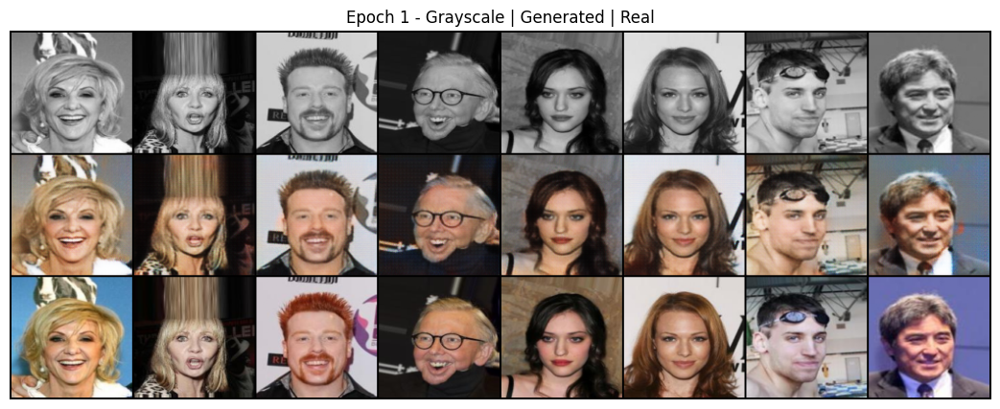

Epoch [2/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.0375, G_Loss=11.7]


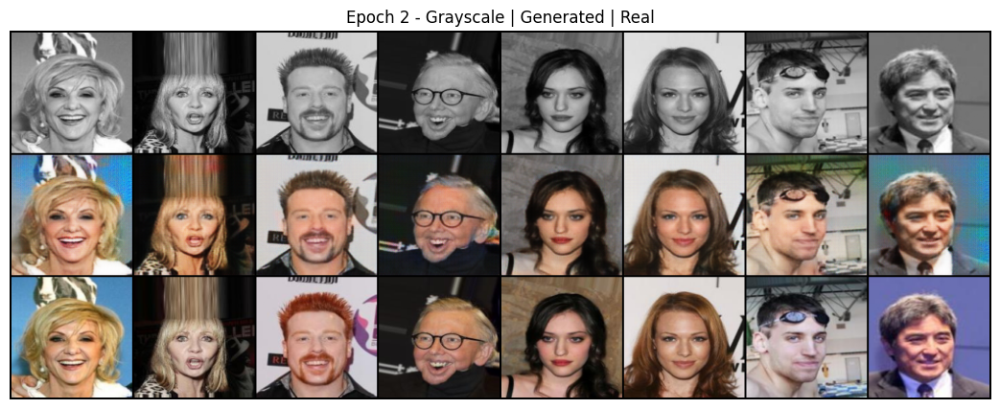

Epoch [3/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.118, G_Loss=11.8]  


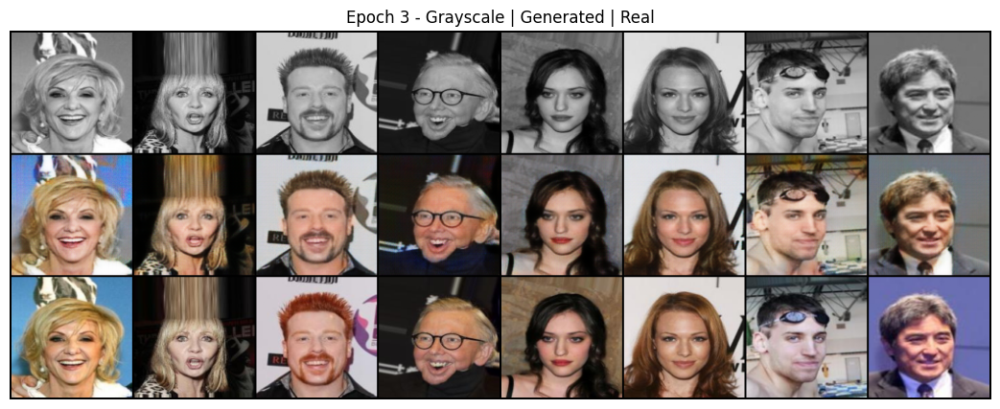

Epoch [4/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.586, G_Loss=9.86]  


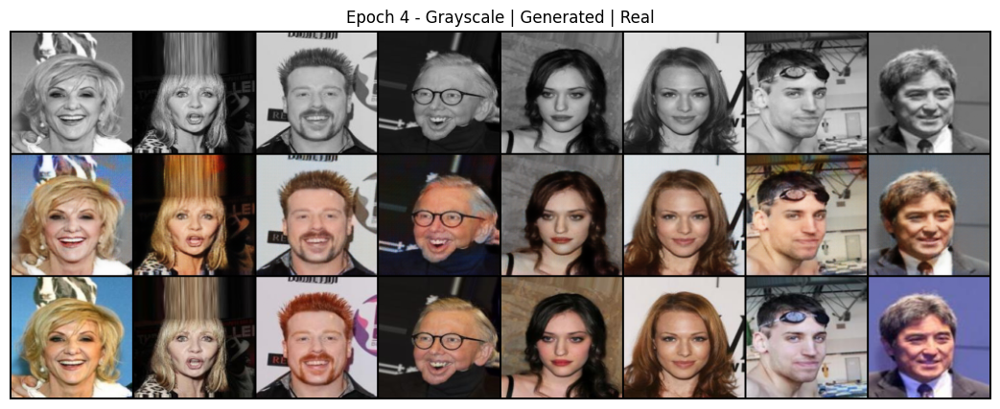

Epoch [5/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.544, G_Loss=9.27] 


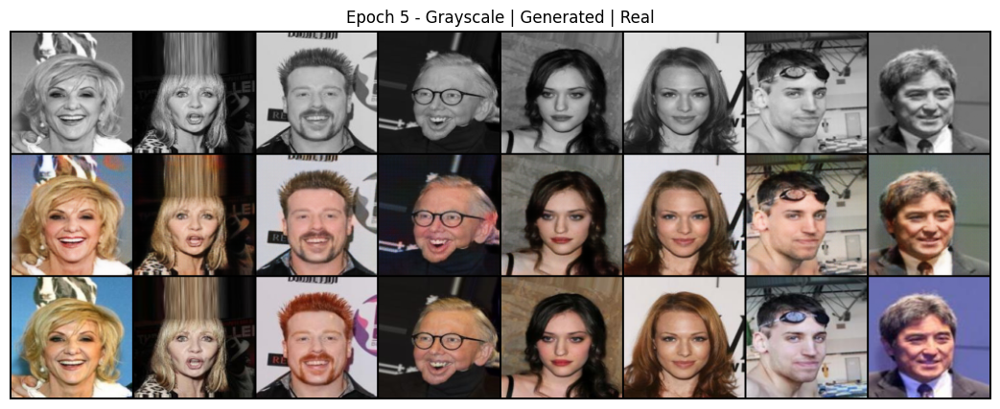

Epoch [6/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.534, G_Loss=7.68]  


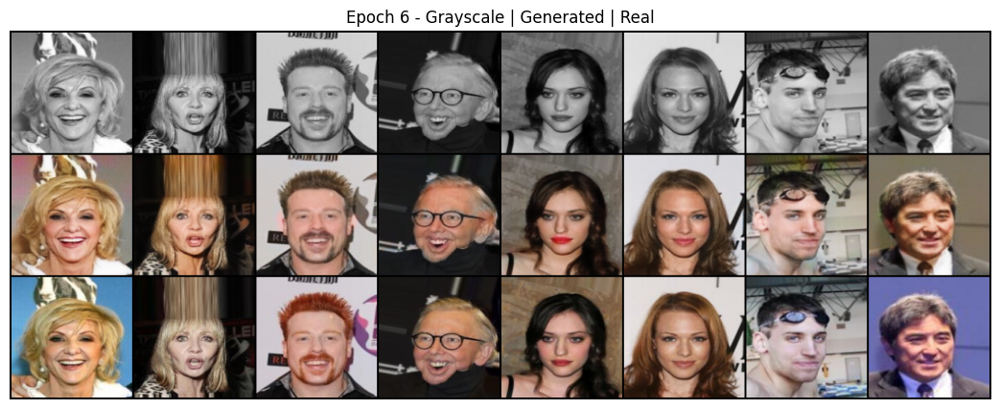

Epoch [7/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.181, G_Loss=9.57]  


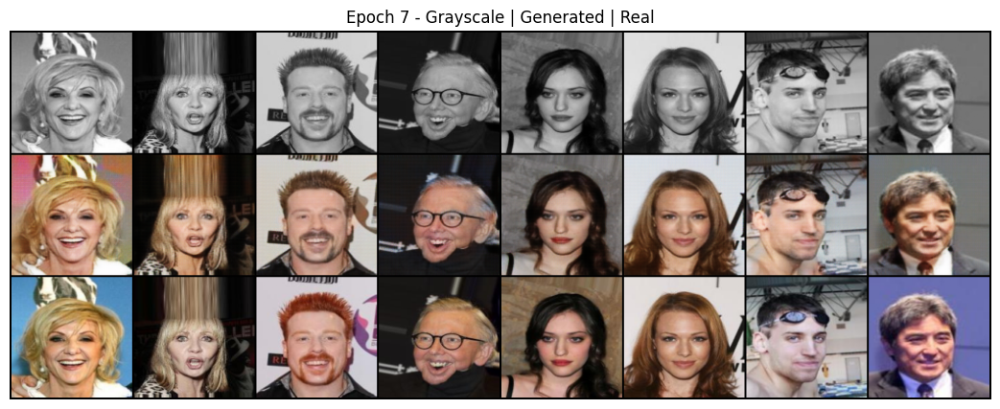

Epoch [8/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.608, G_Loss=9.08]  


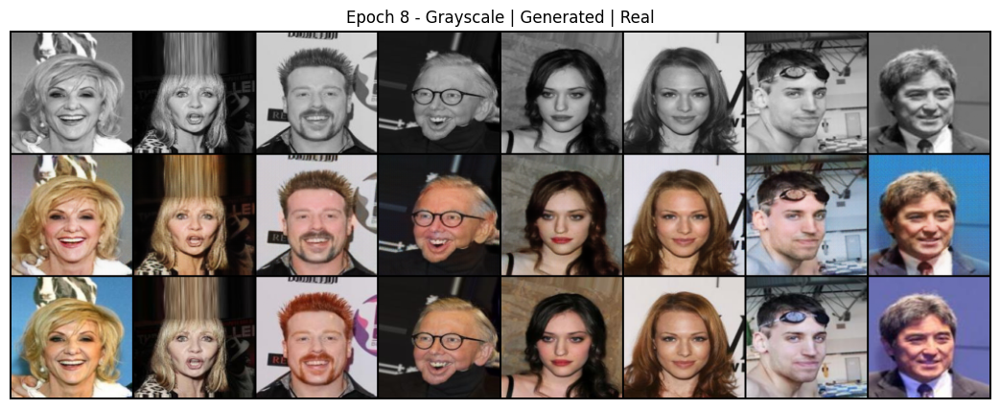

Epoch [9/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.407, G_Loss=9.38]  


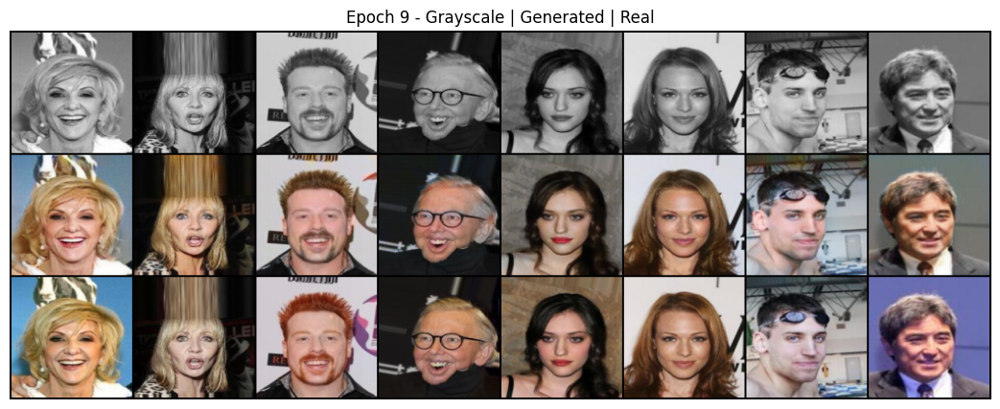

Epoch [10/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.0418, G_Loss=10.9] 


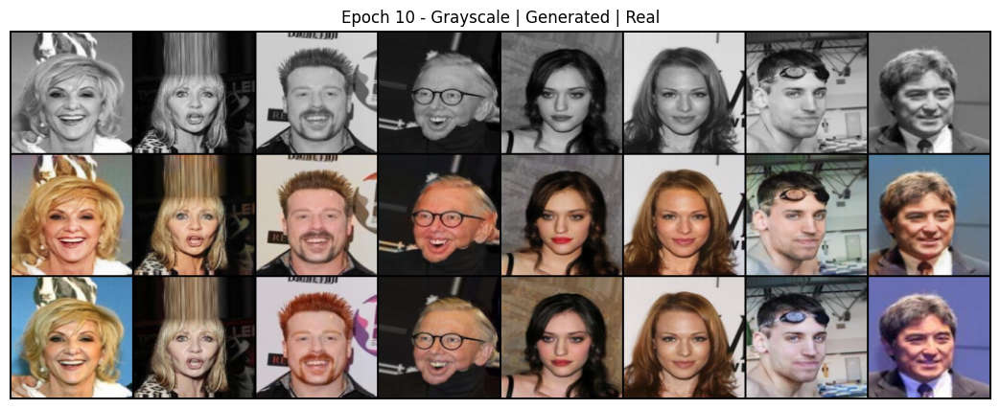

Epoch [11/20]: 100%|██████████| 792/792 [08:59<00:00,  1.47it/s, D_Loss=0.552, G_Loss=8.18]  


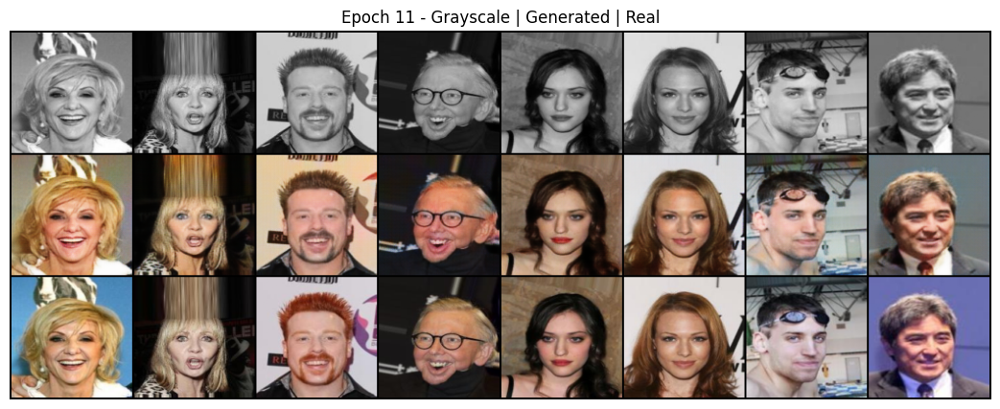

Epoch [12/20]: 100%|██████████| 792/792 [08:59<00:00,  1.47it/s, D_Loss=0.625, G_Loss=7.7]   


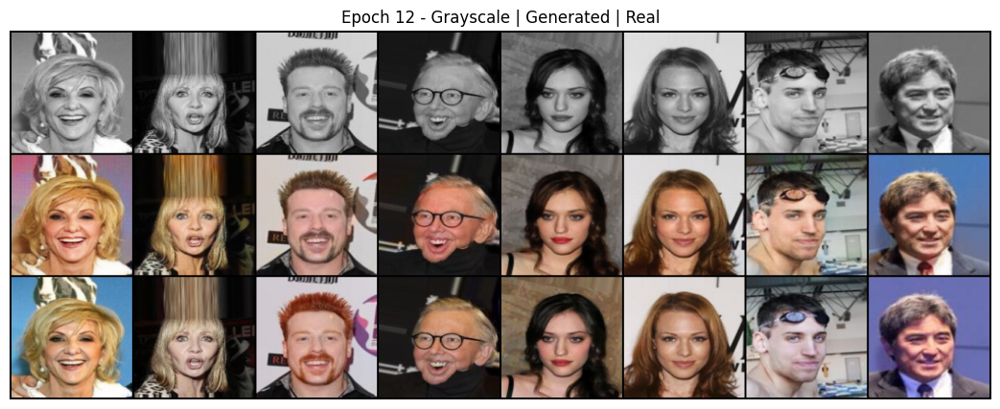

Epoch [13/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.00139, G_Loss=13]   


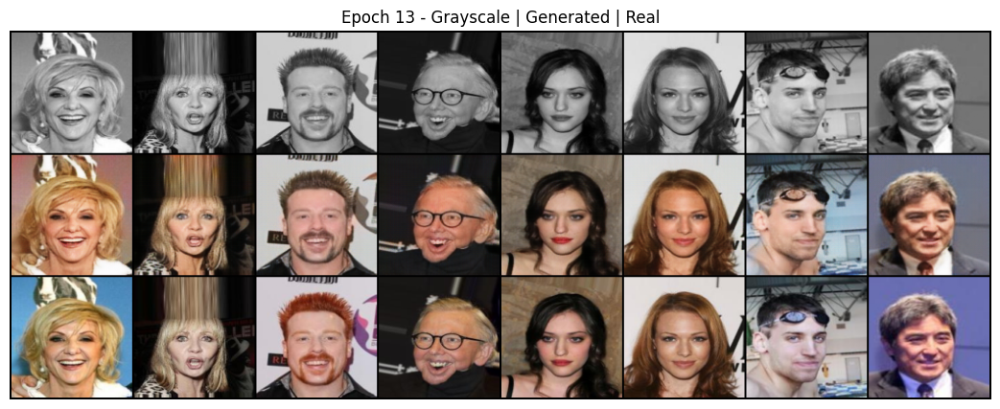

Epoch [14/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.772, G_Loss=7.12]   


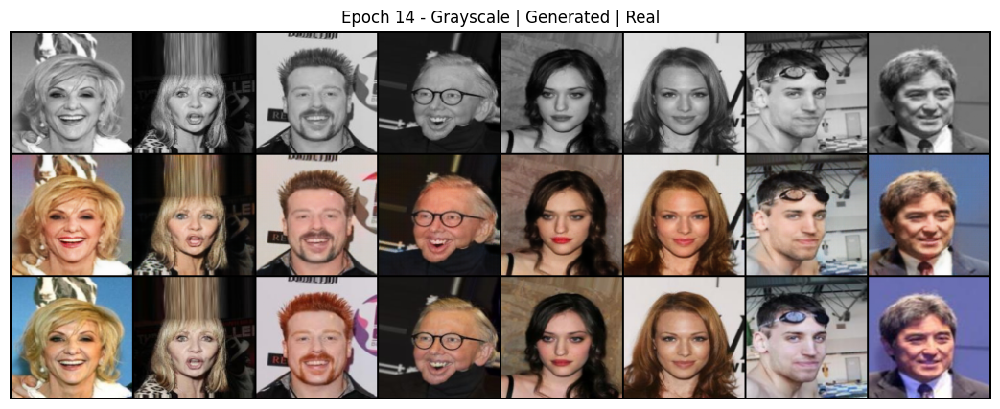

Epoch [15/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.584, G_Loss=7.75]  


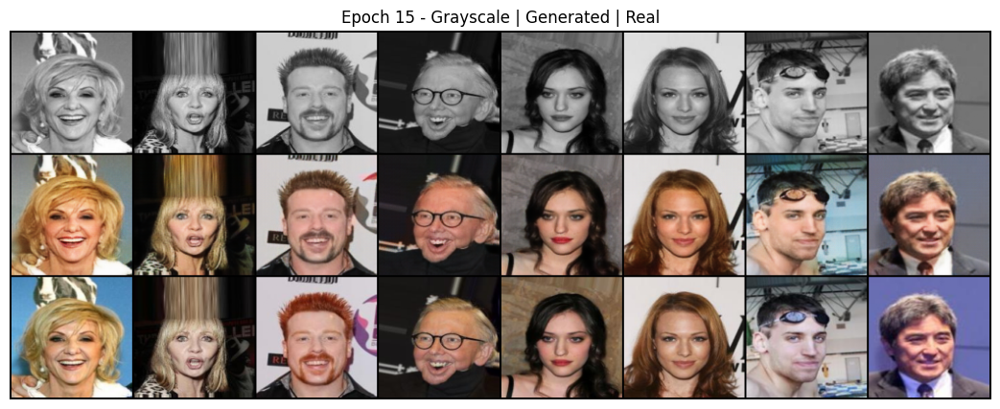

Epoch [16/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.00507, G_Loss=11.1]


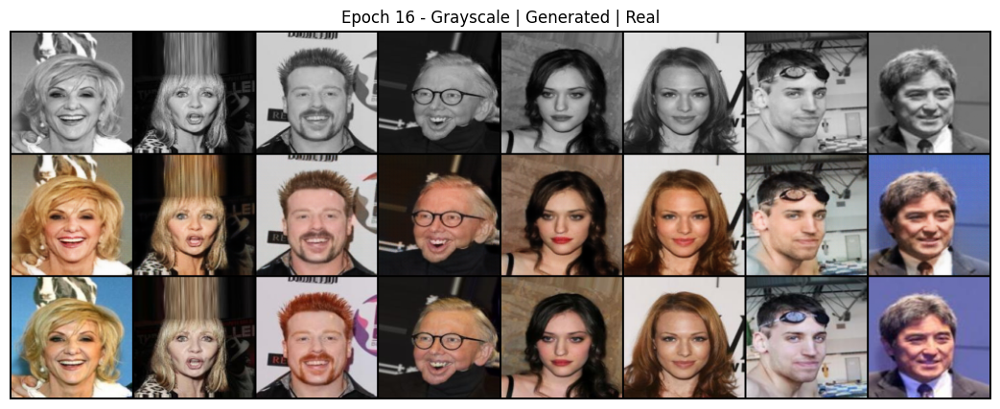

Epoch [17/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.606, G_Loss=7.26]   


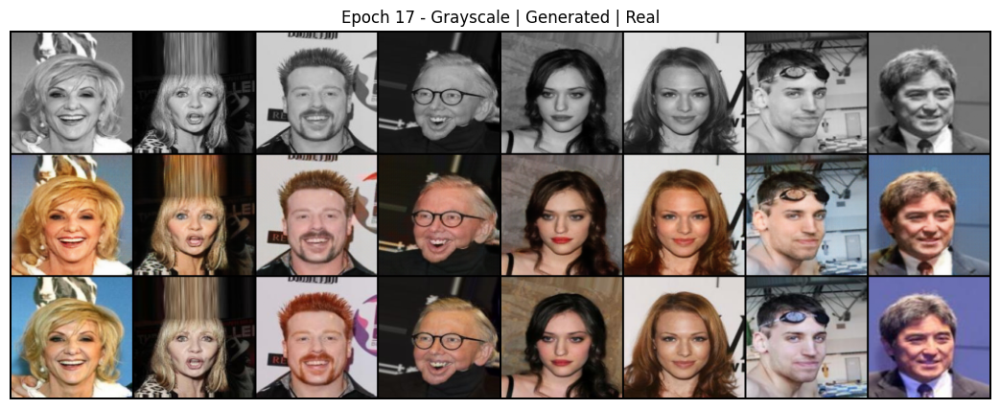

Epoch [18/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.6, G_Loss=6.33]    


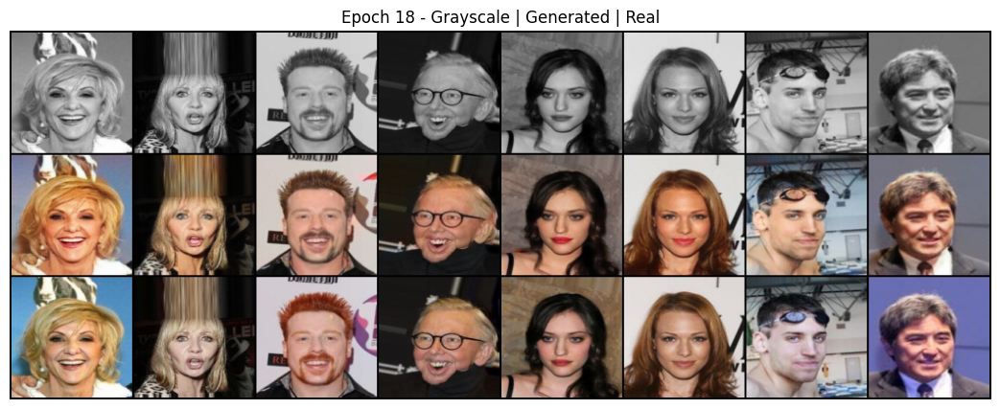

Epoch [19/20]: 100%|██████████| 792/792 [08:59<00:00,  1.47it/s, D_Loss=0.00198, G_Loss=13.2]


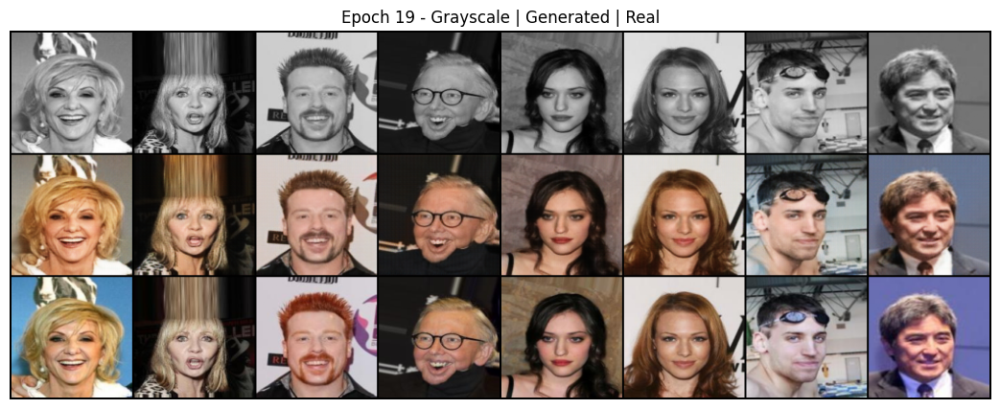

Epoch [20/20]: 100%|██████████| 792/792 [08:58<00:00,  1.47it/s, D_Loss=0.00426, G_Loss=11.9]


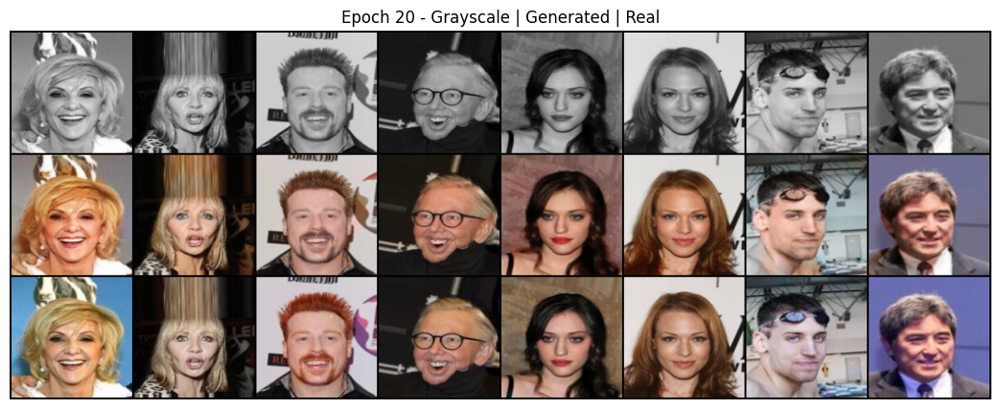

In [46]:
from tqdm import tqdm
import torchvision.transforms.functional as TF
import torchvision
import matplotlib.pyplot as plt

epochs = 20  # or any other value

for epoch in range(epochs):
    generator.train()
    discriminator.train()
    
    loop = tqdm(dataloader, leave=True)
    
    for i, (gray_imgs, real_imgs) in enumerate(loop):
        gray_imgs = gray_imgs.to(device)
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size(0)

        # --------------------
        # Train Discriminator
        # --------------------
        optimizer_D.zero_grad()
        pred_real = discriminator(gray_imgs, real_imgs)
        valid = torch.ones_like(pred_real, device=device)
        d_real_loss = adversarial_loss(pred_real, valid)

        fake_imgs = generator(gray_imgs)
        pred_fake = discriminator(gray_imgs, fake_imgs.detach())
        fake = torch.zeros_like(pred_fake, device=device)
        d_fake_loss = adversarial_loss(pred_fake, fake)

        d_loss = (d_real_loss + d_fake_loss) * 0.5
        d_loss.backward()
        optimizer_D.step()

        # --------------------
        # Train Generator
        # --------------------
        optimizer_G.zero_grad()
        pred_fake = discriminator(gray_imgs, fake_imgs)
        valid = torch.ones_like(pred_fake, device=device)
        g_adv_loss = adversarial_loss(pred_fake, valid)

        g_pixel_loss = pixelwise_loss(fake_imgs, real_imgs)
        g_percep_loss = percep_loss(fake_imgs, real_imgs)

        g_loss = g_adv_loss + 100 * g_pixel_loss + 0.1 * g_percep_loss
        g_loss.backward()
        optimizer_G.step()

        loop.set_description(f"Epoch [{epoch+1}/{epochs}]")
        loop.set_postfix(D_Loss=d_loss.item(), G_Loss=g_loss.item())

    # --------------------
    # Show generated samples after each epoch
    # --------------------
    generator.eval()
    with torch.no_grad():
        for test_gray, test_real in testloader:
            test_gray = test_gray.to(device)
            test_real = test_real.to(device)

            sample_gray = test_gray[:8]
            sample_real = test_real[:8]
            sample_fake = generator(sample_gray)

            sample_gray_3c = sample_gray.expand(-1, 3, -1, -1)
            samples = torch.cat([sample_gray_3c, sample_fake, sample_real], dim=0)
            grid = torchvision.utils.make_grid(samples, nrow=8, normalize=True)

            plt.figure(figsize=(15, 5))
            plt.title(f"Epoch {epoch+1} - Grayscale | Generated | Real")
            plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
            plt.axis("off")
            plt.show()
            break


In [48]:
torch.save(generator.state_dict(), "generator_final.pth")
torch.save(discriminator.state_dict(), "discriminator_final.pth")


In [50]:
import torch
from torchvision.utils import save_image
import os
from tqdm import tqdm
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

# Load generator
generator = UNetGenerator().to(device)
generator.load_state_dict(torch.load("generator_final.pth", map_location=device))
generator.eval()

# Output folder
os.makedirs("results", exist_ok=True)

# Colorfulness metric
def compute_colorfulness(image_np):
    R, G, B = image_np[:, :, 0], image_np[:, :, 1], image_np[:, :, 2]
    rg = np.abs(R - G)
    yb = np.abs(0.5 * (R + G) - B)

    std_rg, std_yb = np.std(rg), np.std(yb)
    mean_rg, mean_yb = np.mean(rg), np.mean(yb)

    return np.sqrt(std_rg**2 + std_yb**2) + 0.3 * np.sqrt(mean_rg**2 + mean_yb**2)

# Track metrics
ssim_scores, psnr_scores, colorfulness_scores = [], [], []

with torch.no_grad():
    # Iterate through each image in batch
    for b in range(gray_img.size(0)):
        # Get individual tensors
        gray = gray_img[b]
        fake = fake_img[b]
        real = real_img[b]
    
        # Save side-by-side
        combined = torch.cat([
            gray.repeat(3, 1, 1),  # Grayscale to 3 channels
            fake,
            real
        ], dim=2)  # concat along width
        save_image(combined, f"results/sample_{idx:03d}_{b}.png", normalize=True)
    
        # Convert to numpy
        fake_np = fake.permute(1, 2, 0).cpu().numpy()
        real_np = real.permute(1, 2, 0).cpu().numpy()
    
        # Clamp
        fake_np = np.clip(fake_np, 0, 1)
        real_np = np.clip(real_np, 0, 1)
    
        # Compute metrics
        ssim_val = ssim(real_np, fake_np, channel_axis=2, data_range=1.0)
        psnr_val = psnr(real_np, fake_np, data_range=1.0)
        colorfulness_val = compute_colorfulness(fake_np)
    
        # Store results
        ssim_scores.append(ssim_val)
        psnr_scores.append(psnr_val)
        colorfulness_scores.append(colorfulness_val)


# Final averages
print(f"Avg SSIM: {np.mean(ssim_scores):.4f}")
print(f"Avg PSNR: {np.mean(psnr_scores):.2f} dB")
print(f"Avg Colorfulness: {np.mean(colorfulness_scores):.2f}")


Avg SSIM: 0.8847
Avg PSNR: 24.29 dB
Avg Colorfulness: 0.22
